In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster

# Load the dataset
df = pd.read_csv('/content/Dataset  (1).csv')

# Show basic info
df.head()


,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [ ]:
# Check for columns related to location
print(df.columns.tolist())

# Check for missing lat/lon
print(df[['Latitude', 'Longitude']].isnull().sum())

# Drop rows without coordinates (if any)
df = df.dropna(subset=['Latitude', 'Longitude'])


['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address', 'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines', 'Average Cost for two', 'Currency', 'Has Table booking', 'Has Online delivery', 'Is delivering now', 'Switch to order menu', 'Price range', 'Aggregate rating', 'Rating color', 'Rating text', 'Votes']
Latitude     0
Longitude    0
dtype: int64


In [ ]:
# Create a basic map centered around India
m = folium.Map(location=[20.5937, 78.9629], zoom_start=5)

# Add marker cluster
marker_cluster = MarkerCluster().add_to(m)

# Add restaurant locations to the map
for idx, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['Restaurant Name'] + " - " + str(row['Cuisines']),
        icon=folium.Icon(color='blue', icon='cutlery', prefix='fa')
    ).add_to(marker_cluster)

m


<ipython-input-4-d57f24435dd8>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Restaurant Count', y='City', data=city_counts.head(10), palette='viridis')


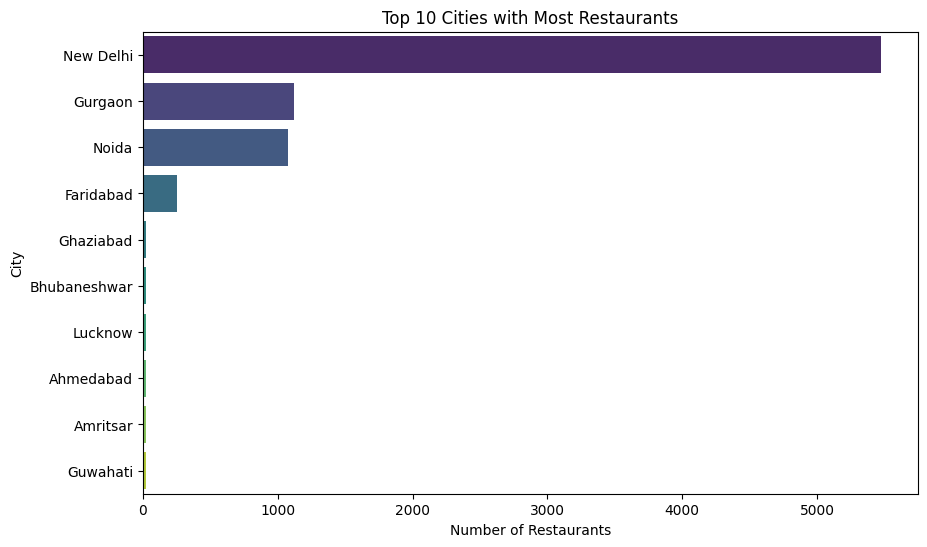

In [ ]:
# Group by city and count restaurants
city_counts = df['City'].value_counts().reset_index()
city_counts.columns = ['City', 'Restaurant Count']

# Plot top 10 cities with most restaurants
plt.figure(figsize=(10,6))
sns.barplot(x='Restaurant Count', y='City', data=city_counts.head(10), palette='viridis')
plt.title('Top 10 Cities with Most Restaurants')
plt.xlabel('Number of Restaurants')
plt.ylabel('City')
plt.show()


In [ ]:
# Group by city and get average rating, price, etc.
city_stats = df.groupby('City').agg({
    'Average Cost for two': 'mean',
    'Aggregate rating': 'mean',
    'Restaurant Name': 'count'
}).reset_index()

city_stats.columns = ['City', 'Avg Cost for Two', 'Avg Rating', 'Restaurant Count']
city_stats.sort_values(by='Restaurant Count', ascending=False).head()


,City,Avg Cost for Two,Avg Rating,Restaurant Count
88,New Delhi,596.088069,2.438845,5473
50,Gurgaon,714.016100,2.651431,1118
89,Noida,539.490741,2.036204,1080
43,Faridabad,447.609562,1.866932,251
48,Ghaziabad,602.000000,2.852000,25


In [ ]:
top_cuisines = df.groupby('City')['Cuisines'].apply(
    lambda x: x.mode().iloc[0] if not x.mode().empty else 'Unknown'
).reset_index()
top_cuisines.columns = ['City', 'Most Common Cuisine']


In [ ]:
insights = pd.merge(city_stats, top_cuisines, on='City')
insights.head(10)


,City,Avg Cost for Two,Avg Rating,Restaurant Count,Most Common Cuisine
0,Abu Dhabi,182.000000,4.300000,20,American
1,Agra,1065.000000,3.965000,20,"North Indian, Mughlai"
2,Ahmedabad,857.142857,4.161905,21,"Cafe, American, Continental, Armenian, Fast Food"
3,Albany,19.750000,3.555000,20,"Japanese, Steak, Sushi"
4,Allahabad,517.500000,3.395000,20,"North Indian, Chinese"
5,Amritsar,480.952381,3.685714,21,North Indian
6,Ankara,87.250000,4.305000,20,"Kebab, Turkish Pizza"
7,Armidale,20.000000,3.500000,1,"Bar Food, Steak"
8,Athens,19.000000,4.200000,20,"American, Italian, Pizza"
9,Auckland,68.250000,4.275000,20,Cafe


In [ ]:
insights.to_csv('city_insights.csv', index=False)
